#IMPORT DATASET FROM KAGGLE

In [ ]:
import os
import kagglehub

data_dir = "/content/drive/MyDrive/project/data"
if not os.path.exists(data_dir):
    os.makedirs(data_dir)

!curl -L -o /content/drive/MyDrive/project/data/indonesian-license-plate-dataset.zip https://www.kaggle.com/api/v1/datasets/download/juanthomaswijaya/indonesian-license-plate-dataset
print(f"Dataset downloaded to: {data_dir}/indonesian-license-plate-dataset.zip")



  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 1961M  100 1961M    0     0  38.6M      0  0:00:50  0:00:50 --:--:-- 51.0M
Dataset downloaded to: /content/drive/MyDrive/project/data/indonesian-license-plate-dataset.zip


In [ ]:
!unzip /content/drive/MyDrive/project/indonesian-license-plate-dataset.zip -d /content/drive/MyDrive/project/raw_data

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train716.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train717.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train718.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train719.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train720.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train721.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train722.txt  
  inflating: /content/drive/MyDrive/project/raw_data/Indonesian License Plate Dataset/labels/train/train723.txt  
  inflating: /content/drive/MyDrive/p

# STEP 1. THE TRAINING

## Install Required Package(or library)

In [ ]:
# Install YOLOv8
!pip install ultralytics
!pip install easyocr

# Import dependencies
import os
import cv2
import torch
import easyocr
import matplotlib.pyplot as plt
from ultralytics import YOLO


# Set dataset path (JANGAN DI UBAH ye)
DATASET_PATH = "/content/drive/MyDrive/project/data"


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 94.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

### Create the yaml file
#####The YAML file in YOLO training is a configuration file that tells YOLO where to find your dataset (images and labels) and defines class names.

In [ ]:
DATA_YAML_PATH = "/content/drive/MyDrive/project/data/data.yaml"

yaml_content = f"""
path: /content/drive/MyDrive/project/data
train: images/train
val: images/val
test: images/test
nc: 1
names: ['license_plate']
"""

# Write to file
with open(DATA_YAML_PATH, "w") as f:
    f.write(yaml_content)

print("data.yaml updated successfully!")


data.yaml updated successfully!


### Training the YOLO

In [ ]:
# Load YOLOv8 model
model = YOLO("yolov8n.pt")

# Train YOLOv8
model.train(
    data="/content/drive/MyDrive/project/data/data.yaml",
    epochs=30,
    batch=16,
    imgsz=1080,
    project="/content/drive/MyDrive/project/runs",
    name="train_yolov8.1"
)


Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/project/data/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=1080, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/project/runs, name=train_yolov8.12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, 

100%|██████████| 5.35M/5.35M [00:00<00:00, 95.8MB/s]


AMP: checks passed ✅
WARNING ⚠️ imgsz=[1080] must be multiple of max stride 32, updating to [1088]


train: Scanning /content/drive/MyDrive/project/data/labels/train.cache... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/project/data/labels/val.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/project/runs/train_yolov8.12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1088 train, 1088 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/project/runs/train_yolov8.12
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.72G      1.251      3.449      1.065         36       1088: 100%|██████████| 50/50 [05:29<00:00,  6.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.18s/it]

                   all        100        179    0.00303      0.508     0.0504     0.0292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.01G      1.163      2.007     0.9773         46       1088: 100%|██████████| 50/50 [02:09<00:00,  2.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        100        179          1      0.548      0.844      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.03G      1.125        1.6      0.984         48       1088: 100%|██████████| 50/50 [02:40<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]

                   all        100        179      0.939       0.95      0.981      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.03G      1.125      1.262     0.9862         32       1088: 100%|██████████| 50/50 [04:00<00:00,  4.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


                   all        100        179       0.95      0.916      0.984      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.05G      1.092      1.082     0.9533         41       1088: 100%|██████████| 50/50 [04:11<00:00,  5.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]

                   all        100        179      0.907      0.855      0.945      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.05G      1.076     0.9572      0.955         27       1088: 100%|██████████| 50/50 [04:15<00:00,  5.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        100        179       0.94      0.911       0.96      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.05G       1.06     0.8321     0.9612         37       1088: 100%|██████████| 50/50 [04:16<00:00,  5.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]

                   all        100        179      0.913      0.936      0.974      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.05G      1.075      0.814     0.9522         32       1088: 100%|██████████| 50/50 [03:48<00:00,  4.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]

                   all        100        179      0.949      0.966      0.988      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.05G      1.033     0.7614     0.9417         36       1088: 100%|██████████| 50/50 [03:22<00:00,  4.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.51it/s]

                   all        100        179      0.964      0.905      0.968      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.06G      1.031     0.7189     0.9496         36       1088: 100%|██████████| 50/50 [04:01<00:00,  4.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.17it/s]

                   all        100        179      0.922      0.988      0.977      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.06G      1.001     0.7039     0.9376         40       1088: 100%|██████████| 50/50 [04:28<00:00,  5.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]

                   all        100        179      0.948      0.983      0.991      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.06G     0.9769     0.6659     0.9289         47       1088: 100%|██████████| 50/50 [05:21<00:00,  6.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        100        179      0.978      0.979      0.992      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.08G     0.9685     0.6343     0.9228         36       1088: 100%|██████████| 50/50 [05:43<00:00,  6.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.52it/s]

                   all        100        179      0.978      0.986      0.994      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.08G     0.9784     0.6242     0.9188         33       1088: 100%|██████████| 50/50 [05:27<00:00,  6.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]

                   all        100        179      0.977      0.961      0.992      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.08G     0.9453     0.5908     0.9207         34       1088: 100%|██████████| 50/50 [06:10<00:00,  7.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]

                   all        100        179      0.944      0.994      0.987       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       7.1G     0.9611     0.5849     0.9226         40       1088: 100%|██████████| 50/50 [06:06<00:00,  7.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        100        179      0.924          1      0.961      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       7.1G     0.9544     0.5886     0.9161         38       1088: 100%|██████████| 50/50 [05:35<00:00,  6.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]

                   all        100        179      0.962      0.983      0.993      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       7.1G     0.9326     0.5705     0.9145         39       1088: 100%|██████████| 50/50 [05:06<00:00,  6.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.21it/s]

                   all        100        179      0.946      0.973      0.975      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.12G      0.915     0.5626     0.9133         43       1088: 100%|██████████| 50/50 [05:29<00:00,  6.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.53it/s]

                   all        100        179      0.941      0.978      0.981      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.12G     0.9194     0.5462     0.8983         52       1088: 100%|██████████| 50/50 [05:47<00:00,  6.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        100        179      0.926          1      0.985      0.754


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      7.12G     0.8718     0.5274     0.8983         28       1088: 100%|██████████| 50/50 [01:42<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        100        179      0.973      0.972      0.992      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      7.12G     0.8992     0.5028     0.9152         33       1088: 100%|██████████| 50/50 [01:41<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        100        179      0.943      0.972      0.985      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      7.12G     0.8717     0.4976      0.901         32       1088: 100%|██████████| 50/50 [01:41<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]


                   all        100        179      0.934      0.983       0.99      0.724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      7.13G     0.8666     0.4852     0.8991         35       1088: 100%|██████████| 50/50 [01:39<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.48it/s]

                   all        100        179      0.931      0.985      0.984      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      7.13G     0.8575     0.4752      0.897         31       1088: 100%|██████████| 50/50 [01:42<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        100        179      0.933      0.994      0.977      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      7.13G     0.8494     0.4663     0.8958         27       1088: 100%|██████████| 50/50 [01:43<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        100        179      0.942      0.994      0.983      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      7.13G     0.8192     0.4559     0.8794         31       1088: 100%|██████████| 50/50 [01:44<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.51it/s]

                   all        100        179      0.936          1       0.98      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.13G     0.8172     0.4388     0.8803         25       1088: 100%|██████████| 50/50 [01:44<00:00,  2.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        100        179      0.943      0.994      0.984      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.13G        0.8     0.4198     0.8789         30       1088: 100%|██████████| 50/50 [01:43<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        100        179      0.947      0.998      0.988      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.13G     0.8006     0.4287     0.8804         30       1088: 100%|██████████| 50/50 [01:42<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        100        179      0.962      0.986      0.987      0.706



30 epochs completed in 1.891 hours.
Optimizer stripped from /content/drive/MyDrive/project/runs/train_yolov8.12/weights/last.pt, 6.3MB
Optimizer stripped from /content/drive/MyDrive/project/runs/train_yolov8.12/weights/best.pt, 6.3MB

Validating /content/drive/MyDrive/project/runs/train_yolov8.12/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:16<00:00,  4.11s/it]


                   all        100        179      0.977      0.959      0.992      0.763
Speed: 0.6ms preprocess, 7.2ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/drive/MyDrive/project/runs/train_yolov8.12


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x795d487fd190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### install pytesseract

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 29 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 0s (15.3 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debco

In [ ]:
import cv2
import torch
import pytesseract
from ultralytics import YOLO
# Import the necessary patch
from google.colab.patches import cv2_imshow


# Load trained YOLO model
model = YOLO("/content/drive/MyDrive/project/runs/train_yolov8/weights/best.pt")

# Read image
image_path = "/content/drive/MyDrive/project/data/images/test/test001.jpg"  # Example image

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image file not found at: {image_path}")

image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is None:
    raise IOError(f"Error loading image: {image_path}")

# Run YOLO detection
results = model(image)[0]  # Get first result

# Loop through detected objects
for box in results.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
    cropped_plate = image[y1:y2, x1:x2]  # Crop license plate

    # Preprocess for OCR (convert to grayscale & threshold)
    gray = cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)  # Reduce noise
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    thresh = cv2.bitwise_not(thresh)  # Invert colors (if needed)


    # Apply OCR
    custom_config = "--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"
    plate_text = pytesseract.image_to_string(thresh, config=custom_config)
    print(f"Detected Plate: {plate_text.strip()}")

    # Draw bounding box & text on image
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, plate_text.strip(), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Show the image using cv2_imshow

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

ModuleNotFoundError: No module named 'pytesseract'

####Use Easy OCR


0: 1088x1088 3 license_plates, 532.0ms
Speed: 16.5ms preprocess, 532.0ms inference, 2.5ms postprocess per image at shape (1, 3, 1088, 1088)
Object ID: 1.0, Detected Plate: 8 5120 BCD 12s, Confidence: 0.83
Object ID: 2.0, Detected Plate: 8 2407UZo, Confidence: 0.81
Object ID: 3.0, Detected Plate: B 2842   PKMI, Confidence: 0.80


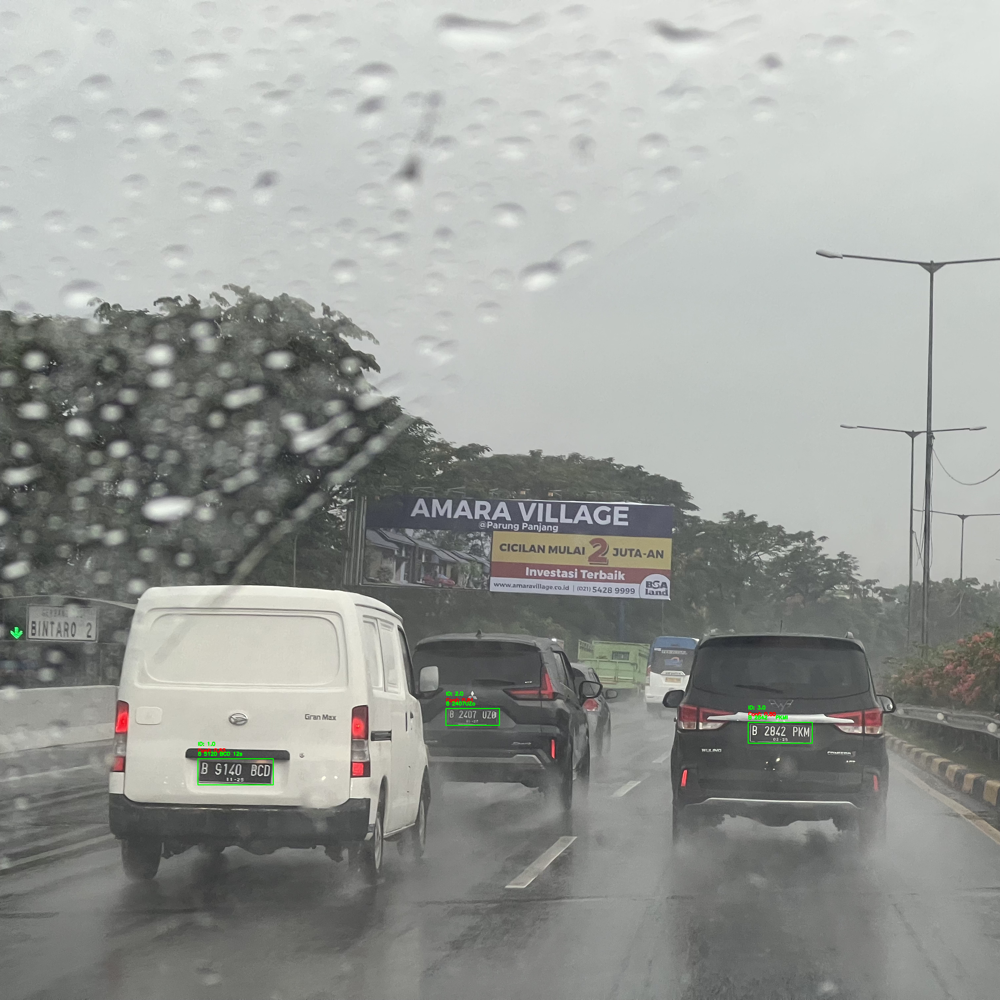

Output image saved to: /content/drive/MyDrive/project/output.jpg


In [ ]:
import os
import cv2
import easyocr
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load trained YOLO model
model = YOLO("/content/drive/MyDrive/project/runs/train_yolov8.12/weights/best.pt")

# Initialize EasyOCR reader
reader = easyocr.Reader(['id'])  # Use 'id' for Indonesian language

# Read image
image_path = "/content/drive/MyDrive/project/test001.jpg"

# Check if the image file exists
if not os.path.exists(image_path):
    raise FileNotFoundError(f"Image file not found at: {image_path}")

# Load image
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is None:
    raise IOError(f"Error loading image: {image_path}")

# Run YOLO detection with tracking
results = model.track(image, tracker="bytetrack.yaml")[0]  # Enable tracking

# Loop through detected objects
for box in results.boxes:
    # Get bounding box coordinates
    x1, y1, x2, y2 = map(int, box.xyxy[0])

    # Get confidence score and object ID
    confidence = box.conf[0].item()  # Confidence score
    object_id = box.id.item() if box.id is not None else -1  # Object ID (assign -1 if None)

    # Crop license plate region
    cropped_plate = image[y1:y2, x1:x2]

    # Check if the cropped region is valid
    if cropped_plate.size == 0:
        print("Warning: Cropped region is empty. Skipping this detection.")
        continue

    # Apply EasyOCR to extract text
    try:
        plate_text = reader.readtext(cropped_plate, detail=0)  # Extract text
        plate_text = " ".join(plate_text)  # Join multiple detected texts
        print(f"Object ID: {object_id}, Detected Plate: {plate_text}, Confidence: {confidence:.2f}")

        # Draw bounding box, object ID, confidence score, and text on image
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, f"ID: {object_id}", (x1, y1 - 40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(image, f"Conf: {confidence:.2f}", (x1, y1 - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
        cv2.putText(image, plate_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    except Exception as e:
        print(f"Error during OCR: {e}")

# Show the image using cv2_imshow
cv2_imshow(image)

# Save the output image (optional)
output_path = "/content/drive/MyDrive/project/output.jpg"
cv2.imwrite(output_path, image)
print(f"Output image saved to: {output_path}")

In [ ]:
import cv2
import easyocr
from ultralytics import YOLO

# Load trained YOLO model
model = YOLO("/content/drive/MyDrive/project/runs/train_yolov8.12/weights/best.pt")

# Initialize EasyOCR reader
reader = easyocr.Reader(['id'])  # Add 'id' for Indonesian characters

def process_video(input_path, output_path=None, time_limit_minutes=1):
    # Initialize video capture
    cap = cv2.VideoCapture(input_path)

    if not cap.isOpened():
        raise IOError(f"Could not open video: {input_path}")

    # Get video properties
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the maximum number of frames to process based on the time limit
    time_limit_seconds = time_limit_minutes * 60
    max_frames = int(fps * time_limit_seconds)

    # Initialize video writer if output path is specified
    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

    frame_count = 0
    processed_frames = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret or frame_count >= max_frames:
            break

        frame_count += 1

        # Run YOLO detection with tracking
        results = model.track(frame, tracker="bytetrack.yaml")[0]

        # Process detections
        for box in results.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cropped_plate = frame[y1:y2, x1:x2]

            # Get confidence score
            confidence = box.conf[0].item()

            # Get object ID (check if it exists)
            object_id = box.id.item() if box.id is not None else -1  # Use -1 if ID is None

            # Perform OCR if plate is large enough
            if cropped_plate.shape[0] > 10 and cropped_plate.shape[1] > 40:
                try:
                    plate_text = reader.readtext(cropped_plate, detail=0)
                    plate_text = " ".join(plate_text)
                except Exception as e:
                    plate_text = "OCR Error"
            else:
                plate_text = "Unknown - Plate Too Small"

            # Draw bounding box, object ID, confidence score, and text on image
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"ID: {object_id}", (x1, y1 - 40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
            cv2.putText(frame, f"Conf: {confidence:.2f}", (x1, y1 - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
            cv2.putText(frame, plate_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Write to output video
        if output_path:
            out.write(frame)

        processed_frames += 1
        print(f"Processed frames: {processed_frames}/{max_frames}", end='\r')

    # Release resources
    cap.release()
    if output_path:
        out.release()
    print(f"\nProcessing complete. Frames processed: {processed_frames}")

# Paths
video_path = "/content/test_video.mp4"
output_video_path = "/content/output_video.mp4"

# Process only the first 1 minute of the video
process_video(
    input_path=video_path,
    output_path=output_video_path,
    time_limit_minutes=1  # Set the time limit in minutes
)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Streaming output truncated to the last 5000 lines.
Processed frames: 134/1800
0: 640x1088 (no detections), 9.0ms
Speed: 5.0ms preprocess, 9.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 1088)
Processed frames: 135/1800
0: 640x1088 (no detections), 9.5ms
Speed: 4.6ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 1088)
Processed frames: 136/1800
0: 640x1088 (no detections), 11.2ms
Speed: 4.7ms preprocess, 11.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 1088)
Processed frames: 137/1800
0: 640x1088 (no detections), 8.9ms
Speed: 6.1ms preprocess, 8.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 1088)
Processed frames: 138/1800
0: 640x1088 (no detections), 8.9ms
Speed: 4.4ms preprocess, 8.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 1088)
Processed frames: 139/1800
0: 640x1088 (no detections), 8.9ms
Speed: 4.4ms preprocess, 8.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640,

##### Download Video from YT

In [ ]:
# Update yt-dlp to the latest version
!pip install -U yt-dlp

import yt_dlp

# Define the YouTube video URL
video_url = "https://www.youtube.com/watch?v=cPhLENS_zOU"

# Set options for yt-dlp
# ydl_opts = {
#     'format': 'bestvideo[height<=480]+bestaudio/best[height<=480]',  # 1080p video + best audio
#     'outtmpl': '/content/test_video480.%(ext)s',  # Save to Colab's temporary storage
#     'merge_output_format': 'mp4',  # Merge into mp4 format
#     'cookiefile': '/content/ytcookies.txt',
# }


ydl_opts = {
    'format': 'best',
    'outtmpl': '/content/test_video.%(ext)s',  # Save to Colab's temporary storage
    'merge_output_format': 'mp4',  # Merge into mp4 format
    'cookiefile': '/content/ytcookies.txt',
}

# Download the video
try:
    with yt_dlp.YoutubeDL(ydl_opts) as ydl:
        ydl.download([video_url])
    print("Video downloaded successfully!")
except Exception as e:
    print(f"Error downloading video: {e}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.9/171.9 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 65.1 MB/s eta 0:00:00
[youtube] Extracting URL: https://www.youtube.com/watch?v=cPhLENS_zOU
[youtube] cPhLENS_zOU: Downloading webpage
[youtube] cPhLENS_zOU: Downloading tv client config
[youtube] cPhLENS_zOU: Downloading player 7d1d50a6
[youtube] cPhLENS_zOU: Downloading tv player API JSON
[info] cPhLENS_zOU: Downloading 1 format(s): 18
[download] Destination: /content/test_video.mp4
[download] 100% of   41.12MiB in 00:00:01 at 32.56MiB/s  
Video downloaded successfully!
